$$
\newcommand{\mat}[1]{\boldsymbol {#1}}
\newcommand{\mattr}[1]{\boldsymbol {#1}^\top}
\newcommand{\matinv}[1]{\boldsymbol {#1}^{-1}}
\newcommand{\vec}[1]{\boldsymbol {#1}}
\newcommand{\vectr}[1]{\boldsymbol {#1}^\top}
\newcommand{\rvar}[1]{\mathrm {#1}}
\newcommand{\rvec}[1]{\boldsymbol{\mathrm{#1}}}
\newcommand{\diag}{\mathop{\mathrm {diag}}}
\newcommand{\set}[1]{\mathbb {#1}}
\newcommand{\norm}[1]{\left\lVert#1\right\rVert}
\newcommand{\pderiv}[2]{\frac{\partial #1}{\partial #2}}
\newcommand{\bm}[1]{{\bf #1}}
\newcommand{\bb}[1]{\bm{\mathrm{#1}}}
$$

# Part 2: Generative Adversarial Networks
<a id=part3></a>

In this part we will implement and train a generative adversarial network and apply it to the task of image generation.

In [1]:
import unittest
import os
import sys
import pathlib
import urllib
import shutil
import re
import zipfile

import numpy as np
import torch
import matplotlib.pyplot as plt

%load_ext autoreload
%autoreload 2

test = unittest.TestCase()
plt.rcParams.update({'font.size': 12})
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print('Using device:', device)

Using device: cuda


### Obtaining the dataset
<a id=part3_1></a>

Let's begin by downloading a dataset of images that we want to learn to generate. 
We'll use the [Labeled Faces in the Wild](http://vis-www.cs.umass.edu/lfw/) (LFW) dataset which contains many labeled faces of famous individuals.

We're going to train our generative model to generate a specific face, not just any face.
Since the person with the most images in this dataset is former president George W. Bush, we'll set out to train a Bush Generator :)

However, if you feel adventurous and/or prefer to generate something else, feel free to edit the `PART2_CUSTOM_DATA_URL` variable in `hw3/answers.py`.


You can use a custom dataset, by editing the `PART3_CUSTOM_DATA_URL` variable in `hw3/answers.py`, and get a bonus!

In [2]:
import cs236781.plot as plot
import cs236781.download
from hw3.answers import PART3_CUSTOM_DATA_URL as CUSTOM_DATA_URL

DATA_DIR = pathlib.Path.home().joinpath('.pytorch-datasets')
if CUSTOM_DATA_URL is None:
    DATA_URL = 'http://vis-www.cs.umass.edu/lfw/lfw-bush.zip'
else:
    DATA_URL = CUSTOM_DATA_URL

_, dataset_dir = cs236781.download.download_data(out_path=DATA_DIR, url=DATA_URL, extract=True, force=False)

File /home/galkesten/.pytorch-datasets/lfw-bush.zip exists, skipping download.
Extracting /home/galkesten/.pytorch-datasets/lfw-bush.zip...
Extracted 531 to /home/galkesten/.pytorch-datasets/lfw/George_W_Bush


Create a `Dataset` object that will load the extraced images:

In [3]:
import torchvision.transforms as T
from torchvision.datasets import ImageFolder

im_size = 64
tf = T.Compose([
    # Resize to constant spatial dimensions
    T.Resize((im_size, im_size)),
    # PIL.Image -> torch.Tensor
    T.ToTensor(),
    # Dynamic range [0,1] -> [-1, 1]
    T.Normalize(mean=(.5,.5,.5), std=(.5,.5,.5)),
])

ds_gwb = ImageFolder(os.path.dirname(dataset_dir), tf)

OK, let's see what we got. You can run the following block multiple times to display a random subset of images from the dataset.

Found 530 images in dataset folder.


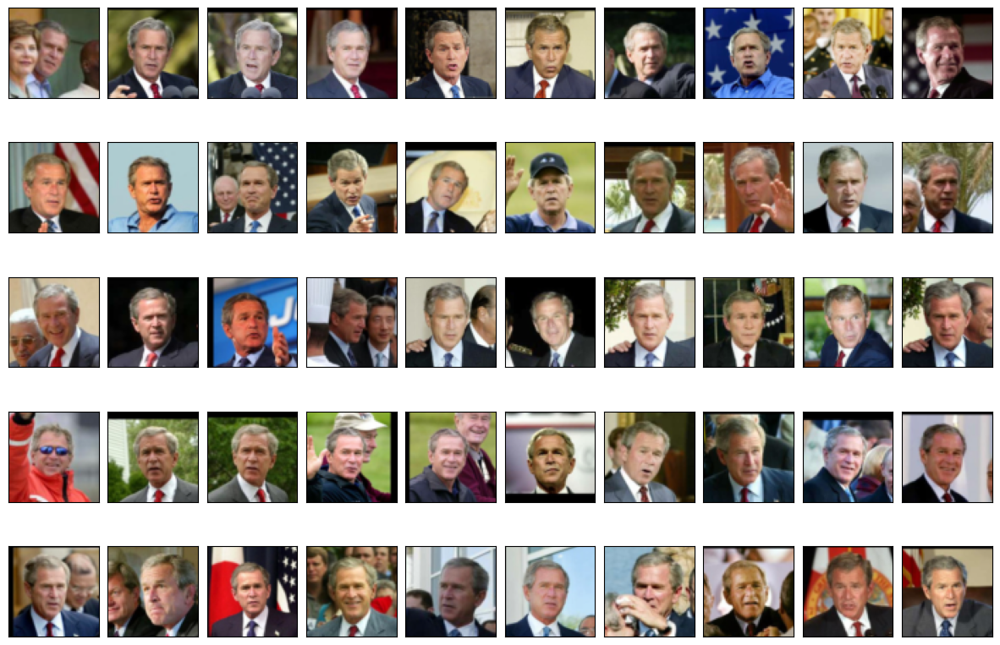

In [4]:
_ = plot.dataset_first_n(ds_gwb, 50, figsize=(15,10), nrows=5)
print(f'Found {len(ds_gwb)} images in dataset folder.')

In [5]:
x0, y0 = ds_gwb[0]
x0 = x0.unsqueeze(0).to(device)
print(x0.shape)

test.assertSequenceEqual(x0.shape, (1, 3, im_size, im_size))

torch.Size([1, 3, 64, 64])


## Generative Adversarial Nets (GANs)
<a id=part3_2></a>

GANs, first proposed in a [paper](https://arxiv.org/pdf/1406.2661.pdf) by Ian Goodfellow in 2014 are today arguably the most popular type of generative model. GANs are currently producing state of the art
results in generative tasks over many different domains.

In a GAN model, two different neural networks compete against each other: A **generator** and a **discriminator**.

- The Generator, which we'll denote as $\Psi _{\bb{\gamma}} : \mathcal{U} \rightarrow \mathcal{X}$, maps a latent-space variable
$\bb{u}\sim\mathcal{N}(\bb{0},\bb{I})$ to an instance-space variable $\bb{x}$ (e.g. an image).
Thus a parametric evidence distribution $p_{\bb{\gamma}}(\bb{X})$ is generated,
which we typically would like to be as close as possible to the real evidence distribution, $p(\bb{X})$.

- The Discriminator, $\Delta _{\bb{\delta}} : \mathcal{X} \rightarrow [0,1]$, is a network which,
given an instance-space variable $\bb{x}$, returns the  probability that $\bb{x}$ is real, i.e. that $\bb{x}$
was sampled from $p(\bb{X})$ and not $p_{\bb{\gamma}}(\bb{X})$.


<img src="imgs/gan.jpg" />

### Training GANs
<a id=part3_3></a>

The generator is trained to generate "fake" instances which will maximally fool the
discriminator into returning that they're real. Mathematically, the generator's parameters
$\bb{\gamma}$ should be chosen such as to **maximize** the expression
$$
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

The discriminator is trained to classify between real images, coming from the training set,
and fake images generated by the generator.
Mathematically, the discriminator's parameters $\bb{\delta}$ should be chosen such as to
**maximize** the expression
$$
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

These two competing objectives can thus be expressed as the following min-max optimization:
$$
\min _{\bb{\gamma}} \max _{\bb{\delta}} \,
\mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

A key insight into GANs is that we can interpret the above maximum as the *loss* with respect to
$\bb{\gamma}$:

$$
L({\bb{\gamma}}) =
\max _{\bb{\delta}} \, \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, + \,
  \mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

This means that the generator's loss function trains together with the generator
itself in an adversarial manner. In contrast, when training our VAE we used a fixed L2 norm
as a data loss term.

### Model Implementation
<a id=part3_4></a>

We'll now implement a Deep Convolutional GAN (DCGAN) model.
See the DCGAN [paper](https://arxiv.org/pdf/1511.06434.pdf) for architecture ideas and tips for training.

**TODO**: Implement the `Discriminator` class in the `hw3/gan.py` module.
If you wish you can reuse the `EncoderCNN` class from the VAE model as the first part of the Discriminator.

In [6]:
import hw3.gan as gan

dsc = gan.Discriminator(in_size=x0[0].shape).to(device)
print(dsc)

d0 = dsc(x0)
print(d0.shape)
test.assertSequenceEqual(d0.shape, (1,1))

Discriminator(
  (cnn): EncoderCNN(
    (cnn): Sequential(
      (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): LeakyReLU(negative_slope=0.2, inplace=True)
      (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (4): LeakyReLU(negative_slope=0.2, inplace=True)
      (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (7): LeakyReLU(negative_slope=0.2, inplace=True)
      (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): LeakyReLU(negative_slope=0.2, inplace=True)
    )
  )
  (fc): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Lin

**TODO**: Implement the `Generator` class in the `hw3/gan.py` module.
If you wish you can reuse the `DecoderCNN` class from the VAE model as the last part of the Generator.

In [7]:
import hw3.gan as gan
z_dim = 128
gen = gan.Generator(z_dim, 4).to(device)
print(gen)

z = torch.randn(1, z_dim).to(device)
xr = gen(z)
print(xr.shape)

test.assertSequenceEqual(x0.shape, xr.shape)

Generator(
  (initial): Sequential(
    (0): ConvTranspose2d(128, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv): DecoderCNN(
    (cnn): Sequential(
      (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU(inplace=True)
      (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (8): ReLU(inplace=True)
      (9): ConvTranspose2d(64, 3, kernel_size=(4, 4

### Loss Implementation
<a id=part3_5></a>

Let's begin with the discriminator's loss function.
Based on the above we can flip the sign and say we want to update the 
Discriminator's parameters $\bb{\delta}$ so that they **minimize** the expression
$$
- \mathbb{E} _{\bb{x} \sim p(\bb{X}) } \log \Delta _{\bb{\delta}}(\bb{x})  \, - \,
\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (1-\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) )).
$$

We're using the Discriminator twice in this expression;
once to classify data from the real data distribution and
once again to classify generated data.
Therefore our loss should be computed based on these two terms.
Notice that since the discriminator returns a probability, we can formulate the above as two cross-entropy losses.

GANs are notoriously diffucult to train.
One common trick for improving GAN stability during training is to make the classification labels noisy for the discriminator. This can be seen as a form of regularization, to help prevent the discriminator from overfitting.

We'll incorporate this idea into our loss function. Instead of labels being equal to 0 or 1, we'll make them
"fuzzy", i.e. random numbers in the ranges $[0\pm\epsilon]$ and $[1\pm\epsilon]$.

**TODO**: Implement the `discriminator_loss_fn()` function in the `hw3/gan.py` module.

In [8]:
from hw3.gan import discriminator_loss_fn
torch.manual_seed(42)

y_data = torch.rand(10) * 10
y_generated = torch.rand(10) * 10

loss = discriminator_loss_fn(y_data, y_generated, data_label=1, label_noise=0.3)
print(loss)

test.assertAlmostEqual(loss.item(), 6.4808731, delta=1e-5)


tensor(6.4809)


Similarly, the generator's parameters $\bb{\gamma}$ should **minimize** the expression
$$
-\mathbb{E} _{\bb{z} \sim p(\bb{Z}) } \log (\Delta _{\bb{\delta}}(\Psi _{\bb{\gamma}} (\bb{z}) ))
$$

which can also be seen as a cross-entropy term. This corresponds to "fooling" the discriminator; Notice that the gradient of the loss w.r.t $\bb{\gamma}$ using this expression also depends on $\bb{\delta}$.

**TODO**: Implement the `generator_loss_fn()` function in the `hw3/gan.py` module.

In [9]:
from hw3.gan import generator_loss_fn
torch.manual_seed(42)

y_generated = torch.rand(20) * 10

loss = generator_loss_fn(y_generated, data_label=1)
print(loss)

test.assertAlmostEqual(loss.item(), 0.0222969, delta=1e-3)

tensor(0.0223)


### Sampling
<a id=part3_6></a>

Sampling from a GAN is straightforward, since it learns to generate data from an isotropic Gaussian latent space distribution.

There is an important nuance however. Sampling is required during the process of training the GAN, since
we generate fake images to show the discriminator.
As you'll seen in the next section,  in some cases we'll need our samples to have gradients (i.e., to be part of
the Generator's computation graph).

**TODO**: Implement the `sample()` method in the `Generator` class within the `hw3/gan.py` module.

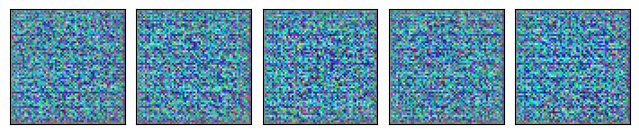

In [10]:
samples = gen.sample(5, with_grad=False)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNone(samples.grad_fn)
_ = plot.tensors_as_images(samples.cpu())

samples = gen.sample(5, with_grad=True)
test.assertSequenceEqual(samples.shape, (5, *x0.shape[1:]))
test.assertIsNotNone(samples.grad_fn)

### Training
<a id=part3_7></a>

Training GANs is a bit different since we need to train two models simultaneously, each with it's own separate loss function and optimizer. We'll implement the training logic as a function that handles one batch of data
and updates both the discriminator and the generator based on it.

As mentioned above, GANs are considered hard to train. To get some ideas and tips you can see this [paper](https://arxiv.org/pdf/1606.03498.pdf), this list of ["GAN hacks"](https://github.com/soumith/ganhacks) or just do it the hard way :)

**TODO**:
1. Implement the `train_batch` function in the `hw3/gan.py` module.
2. Tweak the hyperparameters in the `part3_gan_hyperparams()` function within the `hw3/answers.py` module.

In [28]:
import torch.optim as optim
from torch.utils.data import DataLoader
from hw3.answers import part3_gan_hyperparams

torch.manual_seed(42)

# Hyperparams
hp = part3_gan_hyperparams()
batch_size = hp['batch_size']
z_dim = hp['z_dim']

# Data
dl_train = DataLoader(ds_gwb, batch_size, shuffle=True)
im_size = ds_gwb[0][0].shape

# Model
dsc = gan.Discriminator(im_size).to(device)
gen = gan.Generator(z_dim, featuremap_size=4).to(device)

# Optimizer
def create_optimizer(model_params, opt_params):
    opt_params = opt_params.copy()
    optimizer_type = opt_params['type']
    opt_params.pop('type')
    
    return optim.__dict__[optimizer_type](model_params, **opt_params)
dsc_optimizer = create_optimizer(dsc.parameters(), hp['discriminator_optimizer'])
gen_optimizer = create_optimizer(gen.parameters(), hp['generator_optimizer'])

# Loss
def dsc_loss_fn(y_data, y_generated):
    return gan.discriminator_loss_fn(y_data, y_generated, hp['data_label'], hp['label_noise'])

def gen_loss_fn(y_generated):
    return gan.generator_loss_fn(y_generated, hp['data_label'])

# Training
checkpoint_file = 'checkpoints/gan'
checkpoint_file_final = f'{checkpoint_file}_final'
if os.path.isfile(f'{checkpoint_file}.pt'):
    os.remove(f'{checkpoint_file}.pt')

# Show hypers
print(hp)

{'batch_size': 32, 'z_dim': 100, 'discriminator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'generator_optimizer': {'type': 'Adam', 'lr': 0.0002, 'betas': (0.5, 0.999)}, 'data_label': 1, 'label_noise': 0.0}


**TODO**:
1. Implement the `save_checkpoint` function in the `hw3.gan` module. You can decide on your own criterion regarding whether to save a checkpoint at the end of each epoch.
1. Run the following block to train. It will sample some images from your model every few epochs so you can see the progress.
2. When you're satisfied with your results, rename the checkpoints file by adding `_final`. When you run the `main.py` script to generate your submission, the final checkpoints file will be loaded instead of running training. Note that your final submission zip will not include the `checkpoints/` folder. This is OK.

--- EPOCH 1/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.39it/s]
Discriminator loss: 0.38172309801859017
Generator loss:     8.920398908502916
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


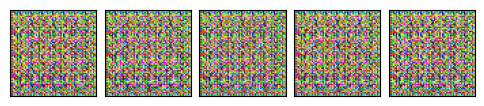

--- EPOCH 2/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.26it/s]
Discriminator loss: 0.105055058539352
Generator loss:     12.61463451385498


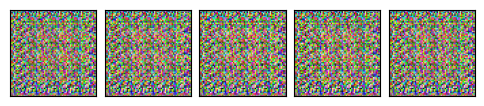

--- EPOCH 3/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.09it/s]
Discriminator loss: 0.1513532032532727
Generator loss:     22.97745900995591


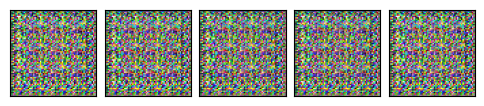

--- EPOCH 4/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.27it/s]
Discriminator loss: 0.2623183764431708
Generator loss:     22.224775987512924


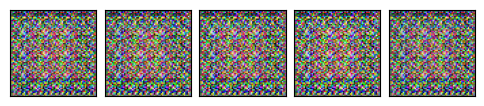

--- EPOCH 5/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.86it/s]
Discriminator loss: 0.3977928010897492
Generator loss:     27.640328575583066


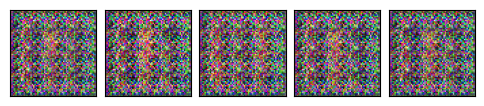

--- EPOCH 6/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.09it/s]
Discriminator loss: 1.2097592518171842
Generator loss:     27.356292163624484


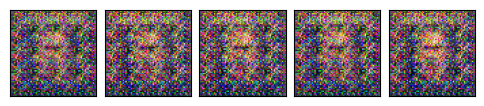

--- EPOCH 7/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.10it/s]
Discriminator loss: 0.997006305383847
Generator loss:     22.481308544383328


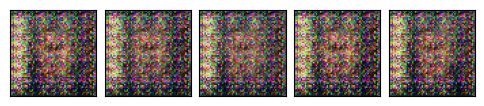

--- EPOCH 8/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.55it/s]
Discriminator loss: 0.8331362874630619
Generator loss:     18.09209419699276


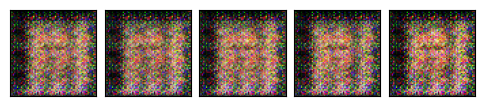

--- EPOCH 9/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.48it/s]
Discriminator loss: 1.2513077697333168
Generator loss:     19.745086754069607


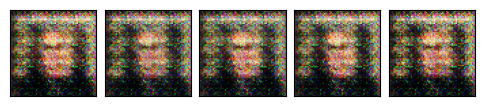

--- EPOCH 10/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.21it/s]
Discriminator loss: 0.8855182256768731
Generator loss:     13.894645999459659


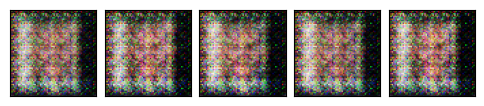

--- EPOCH 11/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.37it/s]
Discriminator loss: 0.8982441035263679
Generator loss:     12.260362540974336


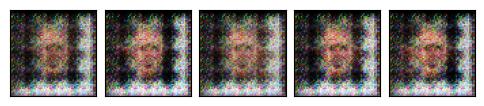

--- EPOCH 12/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.11it/s]
Discriminator loss: 0.8942620868191999
Generator loss:     10.507479471318861


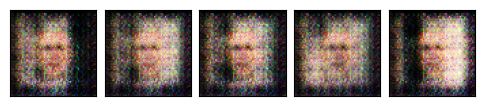

--- EPOCH 13/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.12it/s]
Discriminator loss: 1.0413695801706875
Generator loss:     5.084713487064137
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


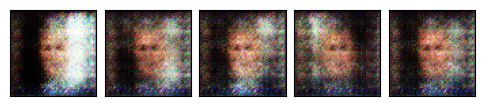

--- EPOCH 14/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.33it/s]
Discriminator loss: 0.5958154972861794
Generator loss:     4.13069504850051
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


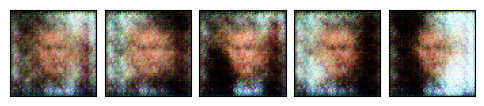

--- EPOCH 15/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.34it/s]
Discriminator loss: 1.063177145579282
Generator loss:     4.648886834873872


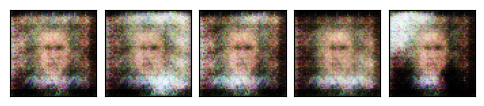

--- EPOCH 16/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.41it/s]
Discriminator loss: 0.8438139873392442
Generator loss:     4.730176911634557


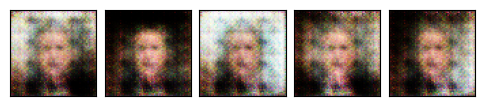

--- EPOCH 17/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.96it/s]
Discriminator loss: 0.48352592131670785
Generator loss:     4.3474126002367806


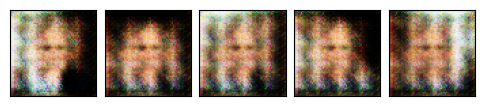

--- EPOCH 18/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.05it/s]
Discriminator loss: 0.3273012611795874
Generator loss:     4.912468293133904


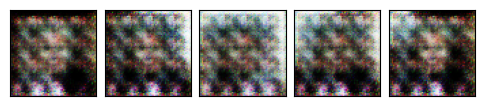

--- EPOCH 19/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.16it/s]
Discriminator loss: 0.3625885725897901
Generator loss:     7.059429883956909


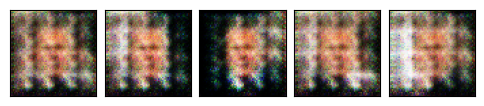

--- EPOCH 20/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.12it/s]
Discriminator loss: 1.5251918487689073
Generator loss:     4.994998300776762


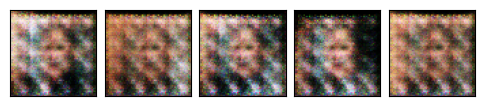

--- EPOCH 21/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.02it/s]
Discriminator loss: 0.3560102998333819
Generator loss:     4.327340616899378


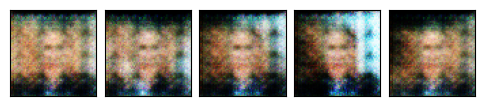

--- EPOCH 22/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.39it/s]
Discriminator loss: 0.8108014683513081
Generator loss:     4.612131118774414


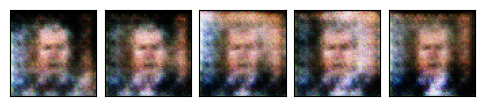

--- EPOCH 23/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.20it/s]
Discriminator loss: 0.5510436156216789
Generator loss:     5.118371262269862


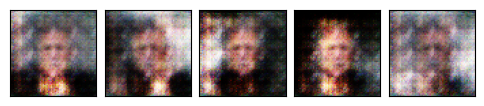

--- EPOCH 24/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.40it/s]
Discriminator loss: 0.45670854431741376
Generator loss:     5.644314415314618


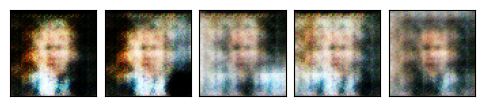

--- EPOCH 25/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.15it/s]
Discriminator loss: 0.7432782220489839
Generator loss:     5.579810668440426


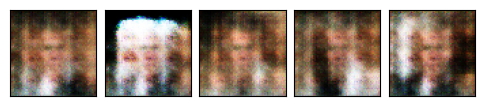

--- EPOCH 26/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.93it/s]
Discriminator loss: 0.9888974252869102
Generator loss:     5.729083453907686


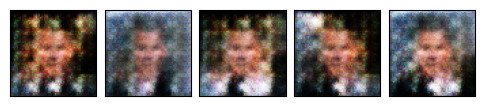

--- EPOCH 27/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.36it/s]
Discriminator loss: 0.687238822965061
Generator loss:     4.411106327000787


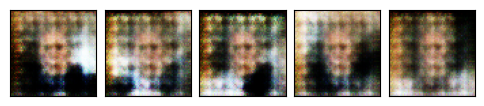

--- EPOCH 28/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.26it/s]
Discriminator loss: 0.5619245452039382
Generator loss:     4.912837337045109


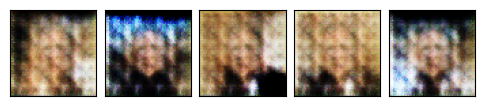

--- EPOCH 29/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.46it/s]
Discriminator loss: 0.30702266842126846
Generator loss:     4.5048857997445495


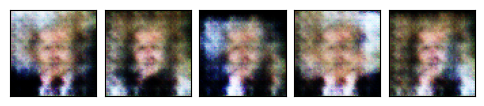

--- EPOCH 30/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.28it/s]
Discriminator loss: 0.6530390587799689
Generator loss:     5.298124916413251


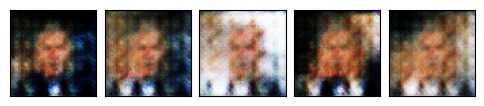

--- EPOCH 31/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.93it/s]
Discriminator loss: 0.8010257500059464
Generator loss:     5.020186361144571


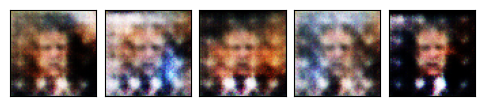

--- EPOCH 32/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.17it/s]
Discriminator loss: 0.5732780791380826
Generator loss:     4.788149616297553


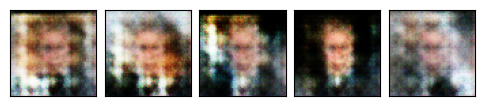

--- EPOCH 33/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.09it/s]
Discriminator loss: 0.37710733448757844
Generator loss:     4.472154084373923


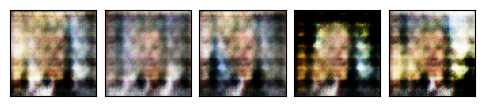

--- EPOCH 34/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.23it/s]
Discriminator loss: 0.24973363516961827
Generator loss:     5.090960376402911


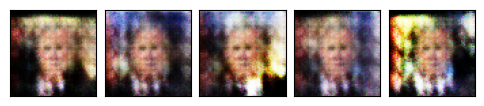

--- EPOCH 35/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.26it/s]
Discriminator loss: 1.2958670144571978
Generator loss:     6.002967140253852


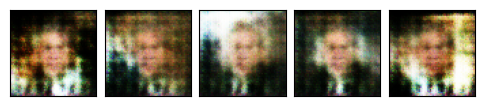

--- EPOCH 36/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.31it/s]
Discriminator loss: 0.9708497515496086
Generator loss:     5.095127933165607


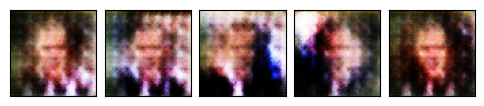

--- EPOCH 37/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.79it/s]
Discriminator loss: 0.4827060234897277
Generator loss:     4.395748040255378


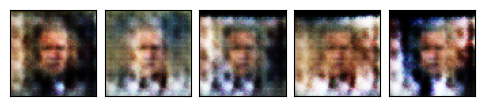

--- EPOCH 38/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.18it/s]
Discriminator loss: 0.4686535921166925
Generator loss:     4.8570557622348565


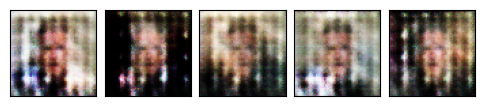

--- EPOCH 39/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.42it/s]
Discriminator loss: 0.3224732104469748
Generator loss:     4.561637289383832


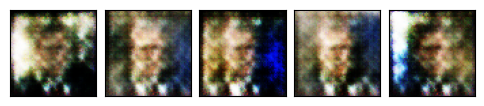

--- EPOCH 40/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.17it/s]
Discriminator loss: 1.0169099507962955
Generator loss:     5.678485574091182


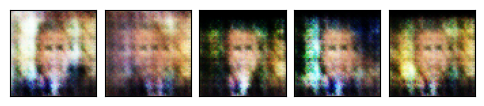

--- EPOCH 41/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.07it/s]
Discriminator loss: 0.593515198896913
Generator loss:     4.976319018532248


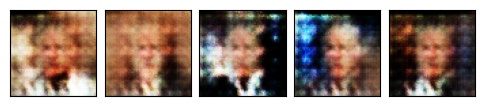

--- EPOCH 42/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.38it/s]
Discriminator loss: 0.652690284392413
Generator loss:     4.433815030490651


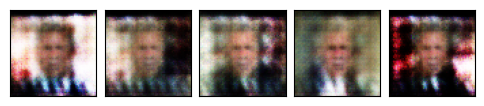

--- EPOCH 43/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.39it/s]
Discriminator loss: 0.43529274884392233
Generator loss:     4.116878102807438
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


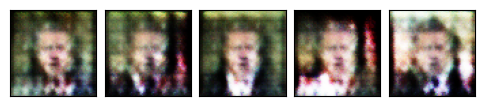

--- EPOCH 44/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.55it/s]
Discriminator loss: 0.3312237727291444
Generator loss:     4.324344578911276


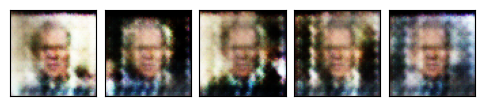

--- EPOCH 45/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.26it/s]
Discriminator loss: 0.9930888282902101
Generator loss:     5.363844187820659


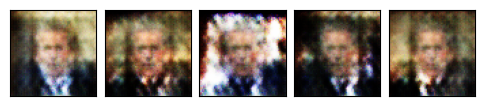

--- EPOCH 46/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.47it/s]
Discriminator loss: 0.7941863655167467
Generator loss:     5.459772474625531


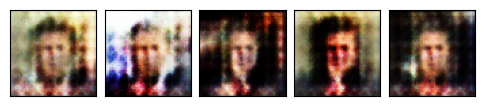

--- EPOCH 47/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.22it/s]
Discriminator loss: 0.4699118014644174
Generator loss:     4.498715064104865


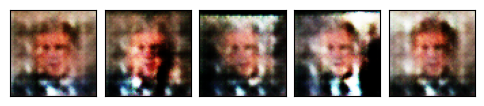

--- EPOCH 48/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.27it/s]
Discriminator loss: 0.5151943318984088
Generator loss:     4.595088474890765


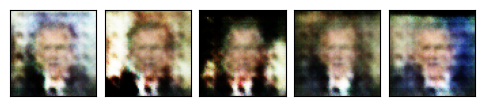

--- EPOCH 49/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.50it/s]
Discriminator loss: 0.5220981967799804
Generator loss:     4.406188151415656


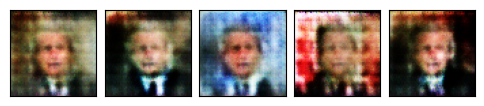

--- EPOCH 50/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.97it/s]
Discriminator loss: 0.42209628136718974
Generator loss:     4.179930707987617


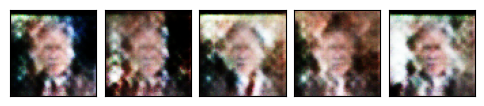

--- EPOCH 51/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.43it/s]
Discriminator loss: 0.42231651439386253
Generator loss:     4.711383959826301


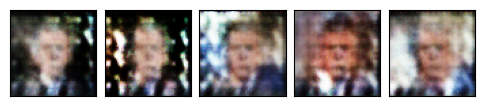

--- EPOCH 52/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.29it/s]
Discriminator loss: 0.618635059279554
Generator loss:     4.843467600205365


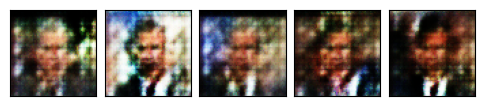

--- EPOCH 53/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.02it/s]
Discriminator loss: 0.9682651696836247
Generator loss:     5.443048939985387


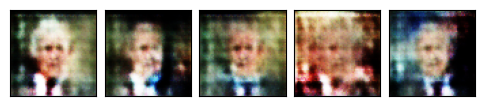

--- EPOCH 54/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.45it/s]
Discriminator loss: 0.5920212444137124
Generator loss:     4.7650947711047005


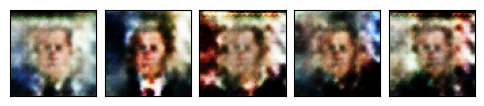

--- EPOCH 55/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.92it/s]
Discriminator loss: 0.37074460439822254
Generator loss:     4.36136721162235


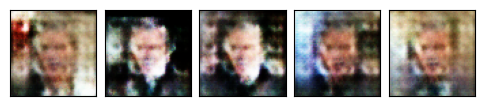

--- EPOCH 56/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.13it/s]
Discriminator loss: 0.3481725151924526
Generator loss:     4.56019188376034


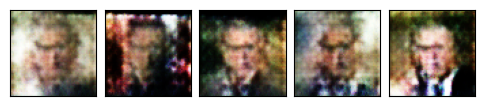

--- EPOCH 57/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.39it/s]
Discriminator loss: 0.6127634065992692
Generator loss:     4.512785841436947


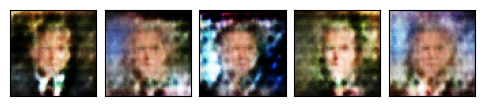

--- EPOCH 58/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.36it/s]
Discriminator loss: 0.5307202067445306
Generator loss:     4.925321887521183


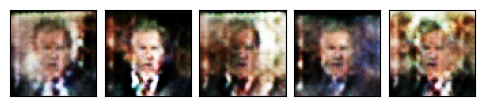

--- EPOCH 59/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.41it/s]
Discriminator loss: 0.4076523969278616
Generator loss:     4.617676187964046


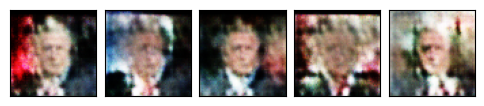

--- EPOCH 60/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.04it/s]
Discriminator loss: 0.2671564208234058
Generator loss:     4.165235575507669


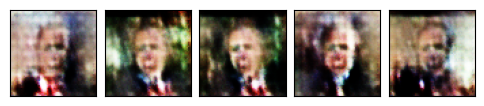

--- EPOCH 61/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.46it/s]
Discriminator loss: 0.36135926930343404
Generator loss:     4.624685806386611


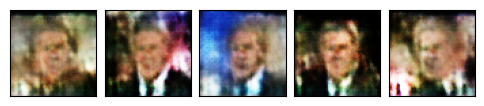

--- EPOCH 62/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.45it/s]
Discriminator loss: 0.98797647041433
Generator loss:     5.027987746631398


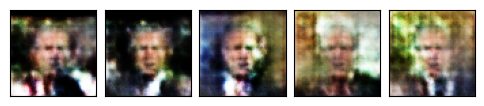

--- EPOCH 63/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.68it/s]
Discriminator loss: 0.6309898995301303
Generator loss:     4.869828925413244


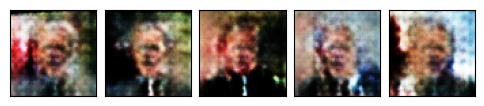

--- EPOCH 64/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.31it/s]
Discriminator loss: 0.4563692948397468
Generator loss:     4.323679580407984


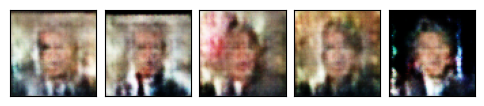

--- EPOCH 65/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.24it/s]
Discriminator loss: 0.33397720929454355
Generator loss:     4.352554433486041


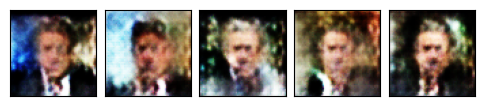

--- EPOCH 66/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.29it/s]
Discriminator loss: 0.7605071418425616
Generator loss:     4.696740490548751


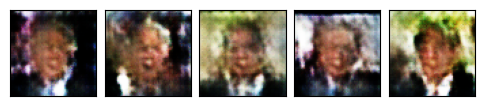

--- EPOCH 67/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  8.90it/s]
Discriminator loss: 0.5442174655549666
Generator loss:     4.205025266198551


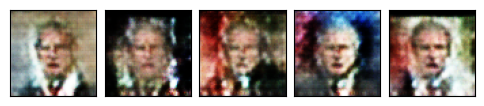

--- EPOCH 68/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.38it/s]
Discriminator loss: 0.33800294469384584
Generator loss:     4.204477534574621


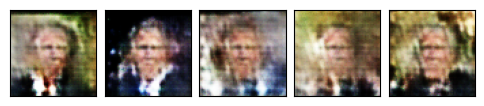

--- EPOCH 69/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.39it/s]
Discriminator loss: 0.48143068306586323
Generator loss:     5.026849241817699


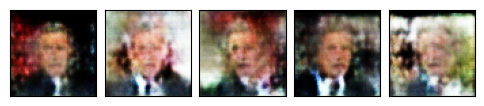

--- EPOCH 70/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.20it/s]
Discriminator loss: 0.41624293695477876
Generator loss:     4.406382911345538


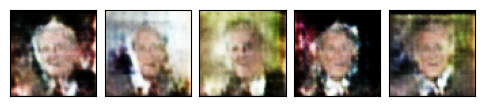

--- EPOCH 71/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.34it/s]
Discriminator loss: 0.7491842411896762
Generator loss:     4.942654567606309


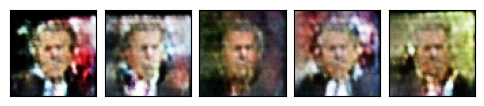

--- EPOCH 72/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.38it/s]
Discriminator loss: 0.6968176890822018
Generator loss:     4.813913983457229


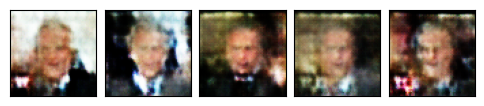

--- EPOCH 73/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.19it/s]
Discriminator loss: 0.7988525146947187
Generator loss:     4.69036206778358


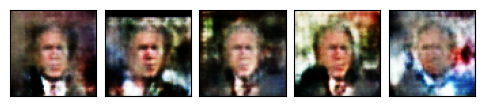

--- EPOCH 74/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.31it/s]
Discriminator loss: 0.4103715989519568
Generator loss:     4.050174811307122
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


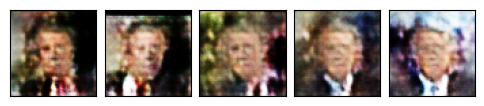

--- EPOCH 75/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.42it/s]
Discriminator loss: 0.30292381784495187
Generator loss:     3.8997843195410336
*** Saved checkpoint checkpoints/gan.pt 
Saved checkpoint.


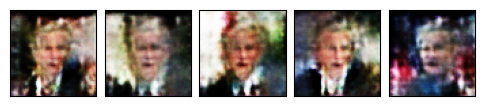

--- EPOCH 76/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.17it/s]
Discriminator loss: 0.34645821329425364
Generator loss:     4.419822868178873


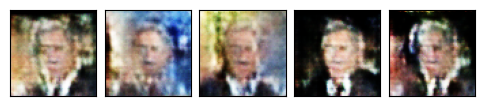

--- EPOCH 77/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.11it/s]
Discriminator loss: 0.5314808558015263
Generator loss:     4.969743728637695


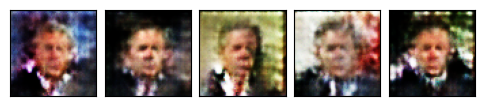

--- EPOCH 78/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.03it/s]
Discriminator loss: 0.8261053018710193
Generator loss:     4.9113671639386345


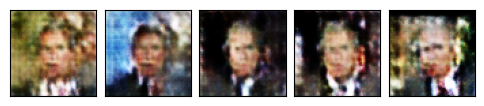

--- EPOCH 79/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.33it/s]
Discriminator loss: 0.7424935856286217
Generator loss:     4.391752232523525


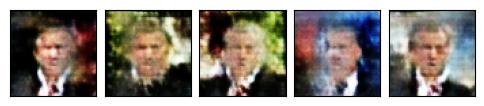

--- EPOCH 80/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.15it/s]
Discriminator loss: 0.33508503700003905
Generator loss:     4.040374671711641


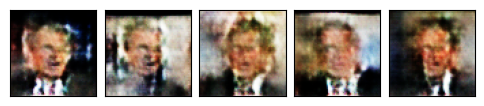

--- EPOCH 81/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.41it/s]
Discriminator loss: 0.24378815994543188
Generator loss:     3.9919259127448585


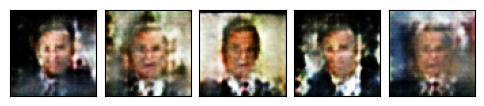

--- EPOCH 82/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.17it/s]
Discriminator loss: 0.3029160078834085
Generator loss:     4.441237323424396


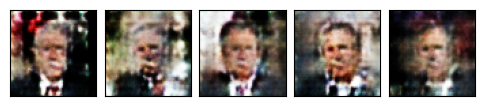

--- EPOCH 83/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.31it/s]
Discriminator loss: 0.820039821898236
Generator loss:     4.584617618252249


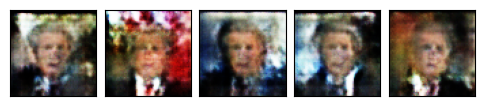

--- EPOCH 84/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.24it/s]
Discriminator loss: 0.5312606955275816
Generator loss:     4.319705794839298


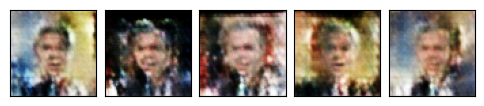

--- EPOCH 85/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.18it/s]
Discriminator loss: 0.6420889654580284
Generator loss:     4.779756489922018


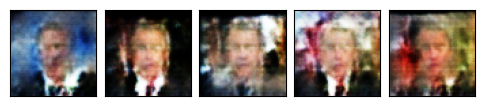

--- EPOCH 86/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.20it/s]
Discriminator loss: 0.31234655134818134
Generator loss:     4.167183918111465


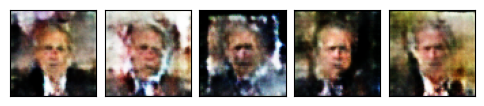

--- EPOCH 87/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.36it/s]
Discriminator loss: 0.2755230130518184
Generator loss:     4.325904860216029


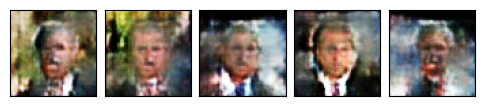

--- EPOCH 88/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.53it/s]
Discriminator loss: 0.24704833153416128
Generator loss:     4.062123873654534


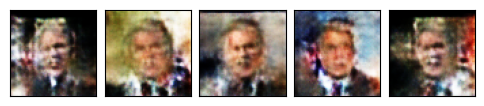

--- EPOCH 89/100 ---
100%|███████████████████████████████████████████| 17/17 [00:01<00:00,  9.44it/s]
Discriminator loss: 0.27832301486940947
Generator loss:     4.354779285543105


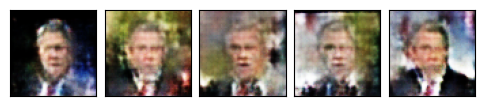

--- EPOCH 90/100 ---
 18%|███████▊                                    | 3/17 [00:00<00:01,  9.46it/s]

In [ ]:
import IPython.display
import tqdm
from hw3.gan import train_batch, save_checkpoint

num_epochs = 100

if os.path.isfile(f'{checkpoint_file_final}.pt'):
    print(f'*** Loading final checkpoint file {checkpoint_file_final} instead of training')
    num_epochs = 0
    gen = torch.load(f'{checkpoint_file_final}.pt', map_location=device)
    checkpoint_file = checkpoint_file_final

try:
    dsc_avg_losses, gen_avg_losses = [], []
    for epoch_idx in range(num_epochs):
        # We'll accumulate batch losses and show an average once per epoch.
        dsc_losses, gen_losses = [], []
        print(f'--- EPOCH {epoch_idx+1}/{num_epochs} ---')

        with tqdm.tqdm(total=len(dl_train.batch_sampler), file=sys.stdout) as pbar:
            for batch_idx, (x_data, _) in enumerate(dl_train):
                x_data = x_data.to(device)
                dsc_loss, gen_loss = train_batch(
                    dsc, gen,
                    dsc_loss_fn, gen_loss_fn,
                    dsc_optimizer, gen_optimizer,
                    x_data)
                dsc_losses.append(dsc_loss)
                gen_losses.append(gen_loss)
                pbar.update()

        dsc_avg_losses.append(np.mean(dsc_losses))
        gen_avg_losses.append(np.mean(gen_losses))
        print(f'Discriminator loss: {dsc_avg_losses[-1]}')
        print(f'Generator loss:     {gen_avg_losses[-1]}')
        
        if save_checkpoint(gen, dsc_avg_losses, gen_avg_losses, checkpoint_file):
            print(f'Saved checkpoint.')
            

        samples = gen.sample(5, with_grad=False)
        fig, _ = plot.tensors_as_images(samples.cpu(), figsize=(6,2))
        IPython.display.display(fig)
        plt.close(fig)
except KeyboardInterrupt as e:
    print('\n *** Training interrupted by user')

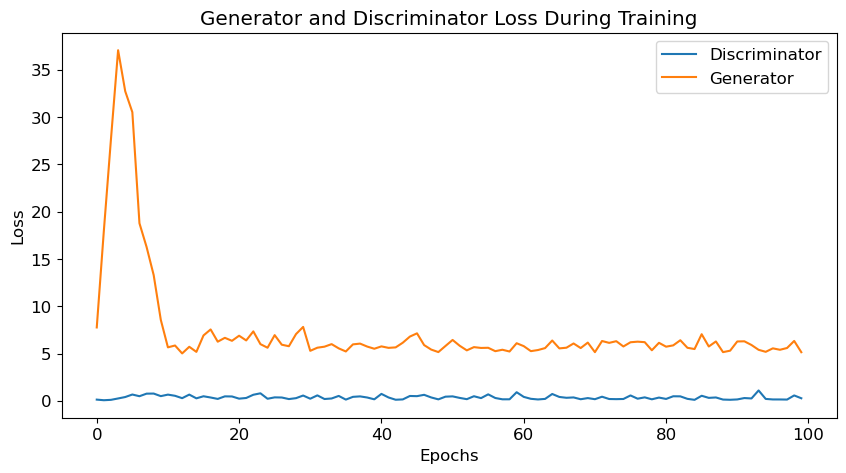

In [21]:

        # Plot losses
        plt.figure(figsize=(10, 5))
        plt.title("Generator and Discriminator Loss During Training")
        plt.plot(dsc_avg_losses, label="Discriminator")
        plt.plot(gen_avg_losses, label="Generator")
        plt.xlabel("Epochs")
        plt.ylabel("Loss")
        plt.legend()
        plt.show()


*** Images Generated from best model:


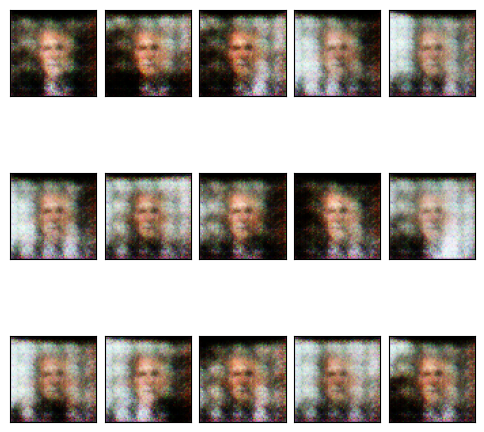

In [22]:
# Plot images from best or last model
if os.path.isfile(f'{checkpoint_file}.pt'):
    gen = torch.load(f'{checkpoint_file}.pt', map_location=device)
print('*** Images Generated from best model:')
samples = gen.sample(n=15, with_grad=False).cpu()
fig, _ = plot.tensors_as_images(samples, nrows=3, figsize=(6,6))

## Questions
<a id=part3_8></a>

**TODO** Answer the following questions. Write your answers in the appropriate variables in the module `hw3/answers.py`.

In [15]:
from cs236781.answers import display_answer
import hw3.answers

### Question 1

Explain in detail why during training we sometimes need to maintain gradients when sampling from the GAN,
and other times we don't. When are they maintained and why? When are they discarded and why?

In [16]:
display_answer(hw3.answers.part2_q1)


**Your answer:**




### Question 2

1. When training a GAN to generate images, should we decide to stop training solely based on the fact that  the Generator loss is below some threshold?
Why or why not?

2. What does it mean if the discriminator loss remains at a constant value while the generator loss decreases?

In [17]:
display_answer(hw3.answers.part2_q2)


**Your answer:**




### Question 3

Compare the results you got when generating images with the VAE to the GAN results.
What's the main difference and what's causing it?

In [18]:
display_answer(hw3.answers.part2_q3)


**Your answer:**



